<function matplotlib.pyplot.show(close=None, block=None)>

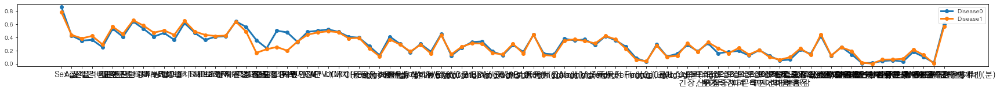

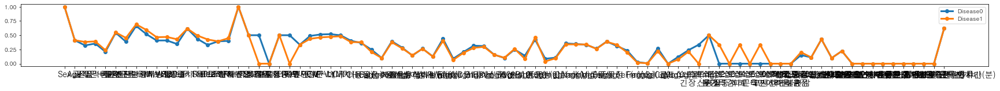

In [ ]:
# 시각화를 위해 scaling 된 값을 DataFrame으로 다시 만듦
x_test_ = pd.DataFrame(x_test,columns=X.columns)
X_plot=pd.DataFrame(X_,columns=X.columns)
X_plot=pd.concat([X_plot,data.loc[:, '현질환']],axis=1).copy()

Disease_1 = X_plot[X_plot['현질환']==1]
Disease_0 = X_plot[X_plot['현질환']==0]

# MinMaxScaler로 스케일 된 값 평균치의 분포를 확인해보자.
plt.figure(figsize=(30,2))
plt.xticks(fontsize=14)
plt.plot(X_plot.drop(columns=['현질환']).columns, Disease_0.drop(columns=['현질환']).copy().mean(), label="Disease0",lw=3,marker='o')
plt.plot(X_plot.drop(columns=['현질환']).columns, Disease_1.drop(columns=['현질환']).copy().mean(), label="Disease1",lw=3,marker='o')
plt.legend()
plt.show
# 중앙값 분포
plt.figure(figsize=(30,2))
plt.xticks(fontsize=14)
plt.plot(X_plot.drop(columns=['현질환']).columns, Disease_0.drop(columns=['현질환']).copy().median(), label="Disease0",lw=3,marker='o')
plt.plot(X_plot.drop(columns=['현질환']).columns, Disease_1.drop(columns=['현질환']).copy().median(), label="Disease1",lw=3,marker='o')
plt.legend()
plt.show

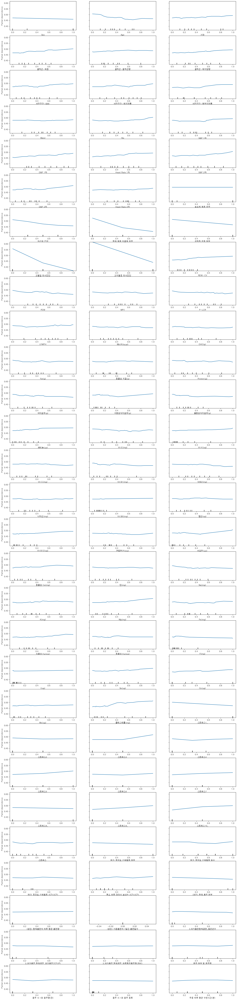

In [ ]:
from sklearn.inspection import partial_dependence
from sklearn.inspection import plot_partial_dependence
fig, ax = plt.subplots(figsize=(20, 90))
plot_partial_dependence(knn, x_test_,x_test_,feature_names=X.columns, target=1,ax=ax)

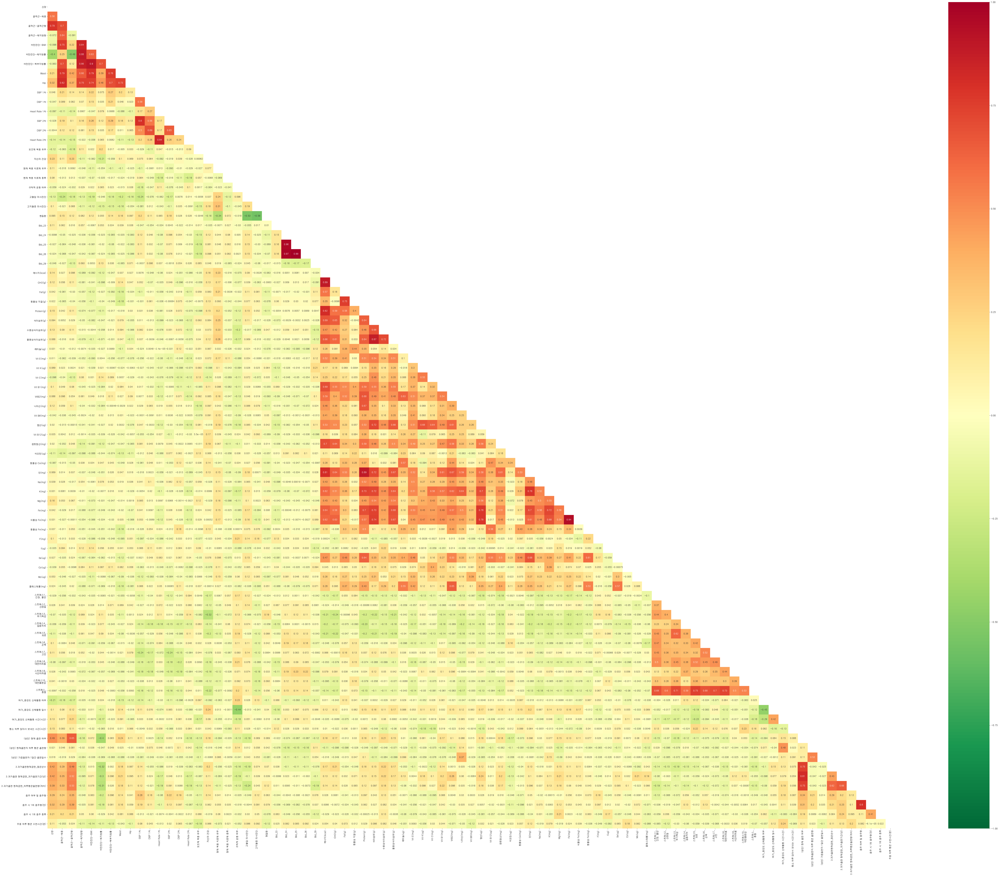

In [ ]:
mask = np.triu(np.ones_like(data.iloc[:,2:90].corr(), dtype=np.bool)) # 히트맵 중앙선과 중복되는 나머지 부분 제거를 위한 마스크 생성
plt.figure(figsize=(100, 80))
sns.heatmap(data.iloc[:,2:90].corr(),
            annot=True, vmin=-1,
            vmax=1, center=0, 
            mask=mask, cmap='RdYlGn_r')
plt.show()

----- 데이터 info -----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 28 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   NO             180 non-null    object 
 1   Sex            180 non-null    int64  
 2   Age            180 non-null    int64  
 3   신장             180 non-null    float64
 4   골격근-체중         180 non-null    float64
 5   골격근-골격근량       180 non-null    float64
 6   골격근-체지방량       180 non-null    float64
 7   비만진단-BMI       180 non-null    float64
 8   비만진단-체지방률      180 non-null    float64
 9   비만진단-복부지방률     180 non-null    float64
 10  Waist          178 non-null    float64
 11  Hip            178 non-null    float64
 12  SBP 1차         180 non-null    int64  
 13  DBP 1차         180 non-null    int64  
 14  Heart Rate 1차  180 non-null    int64  
 15  SBP 2차         180 non-null    int64  
 16  DBP 2차         180 non-null    int64  
 17  Heart Rate 2차  180 non-null    in

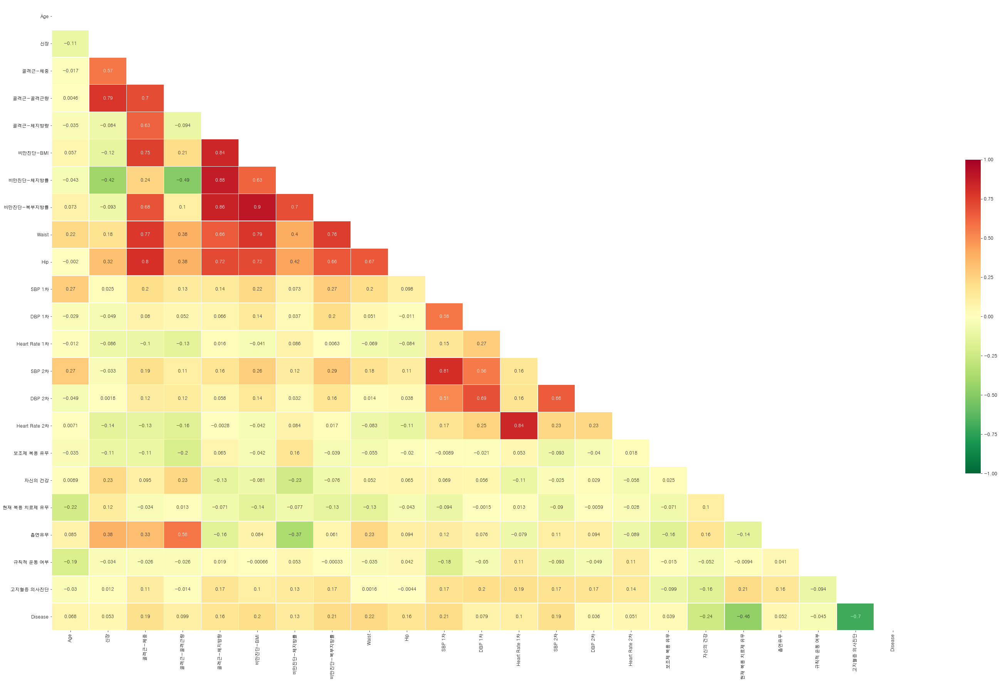

In [ ]:
### RAW 데이터 불러오기 ###
import pandas as pd
import numpy as np
data_g = pd.read_excel("./std_heart-master/Data/Data_ .xlsx", sheet_name='General')
data_g['Disease']=disease
print("----- 데이터 info -----")
print(data_g.info())
print("-----데이터 변수명 -----")
print(data_g.columns, end='\n\n')


mask = np.triu(np.ones_like(data_g.iloc[:,2:90].corr(), dtype=np.bool))  # 히트맵 중앙선과 중복되는 나머지 부분 제거를 위한 마스크 생성

plt.figure(figsize=(50, 30))
sns.heatmap(data_g.iloc[:,2:90].corr(),
            annot=True, vmin=-1, vmax=1,
            center=0, cmap='RdYlGn_r', linewidths=.5,
            mask=mask, cbar_kws={"shrink":.5}) #heatmap, clustermap, 
plt.show()

----- 데이터 info -----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 36 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   NO       180 non-null    object 
 1   Sex      180 non-null    int64  
 2   Age      180 non-null    int64  
 3   Bld_1    0 non-null      float64
 4   Bld_2    178 non-null    float64
 5   Bld_3    177 non-null    float64
 6   Bld_4    178 non-null    float64
 7   Bld_5    180 non-null    int64  
 8   Bld_6    180 non-null    int64  
 9   Bld_7    177 non-null    float64
 10  Bld_8    177 non-null    float64
 11  Bld_9    180 non-null    int64  
 12  Bld_10   177 non-null    float64
 13  Bld_11   177 non-null    float64
 14  Bld_12   177 non-null    float64
 15  Bld_13   177 non-null    float64
 16  Bld_14   179 non-null    float64
 17  Bld_15   179 non-null    float64
 18  Bld_16   179 non-null    float64
 19  Bld_17   179 non-null    float64
 20  Bld_18   179 non-null    float64


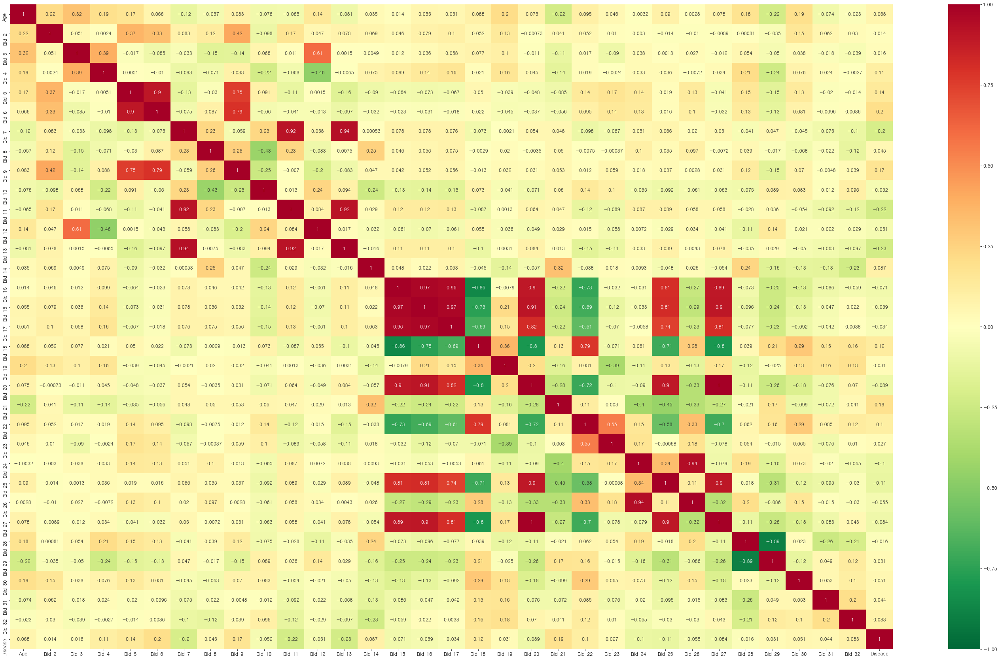

In [ ]:
import pandas as pd
data_b = pd.read_excel("./std_heart-master/Data/Data_ .xlsx", sheet_name='Blood')
data_b['Disease']=disease
print("----- 데이터 info -----")
print(data_b.info())
data_b= data_b.drop(columns='Bld_1').copy()
print("-----데이터 변수명 -----")
print(data_b.columns, end='\n\n')
mask = np.triu(np.ones_like(data_b.iloc[:,2:90].corr(), dtype=np.bool))
plt.figure(figsize=(50, 30))
sns.heatmap(data_b.iloc[:,2:90].corr(),mask=mask, annot=True, vmin=-1, vmax=1, center=0, cmap='RdYlGn_r')
plt.show()

----- 데이터 info -----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 52 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   NO             180 non-null    object 
 1   Sex            180 non-null    int64  
 2   Age            180 non-null    int64  
 3   에너지(kcal)      180 non-null    float64
 4   CHO(g)         180 non-null    float64
 5   Fat(g)         180 non-null    float64
 6   식물성 지질(g)      180 non-null    float64
 7   동물성 지질(g)      180 non-null    float64
 8   Protein(g)     180 non-null    float64
 9   식물성 단백질(g)     180 non-null    float64
 10  동물성 단백질(g)     180 non-null    float64
 11  식이섬유(g)        180 non-null    float64
 12  수용성식이섬유(g)     180 non-null    float64
 13  불용성식이섬유(g)     180 non-null    float64
 14  수분(g)          180 non-null    float64
 15  회분(g)          180 non-null    float64
 16  Vit A(ug RAE)  180 non-null    float64
 17  레티놀(ug)        180 non-null    fl

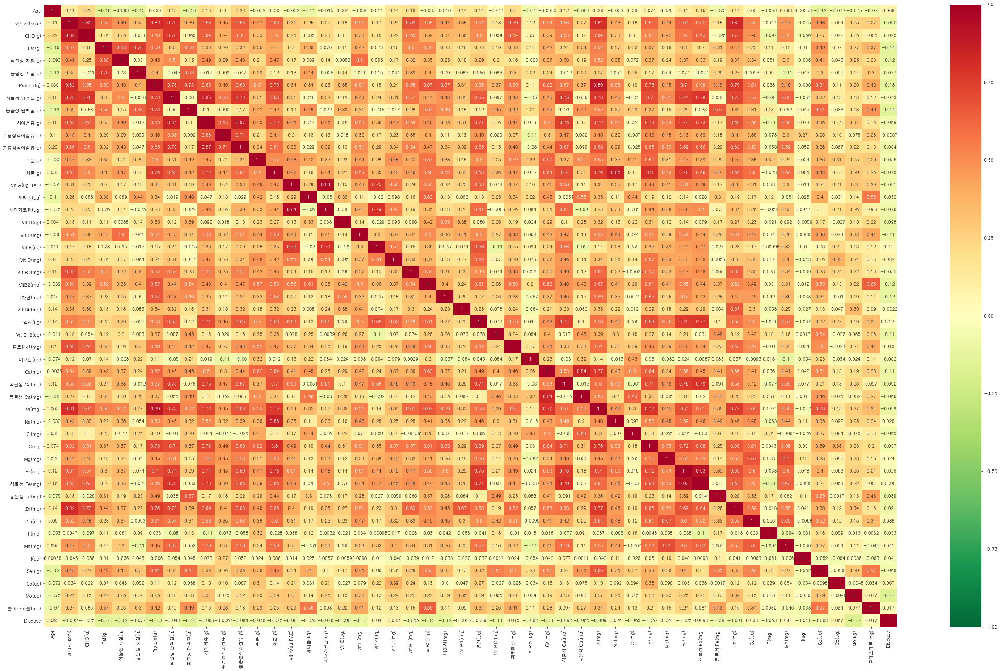

In [ ]:
import pandas as pd
data_n = pd.read_excel("./std_heart-master/Data/Data_ .xlsx", sheet_name='Nutrition')
data_n['Disease']=disease
print("----- 데이터 info -----")
print(data_n.info())
#data_n= data_n.drop(columns='Bld_1').copy()
print("-----데이터 변수명 -----")
print(data_n.columns, end='\n\n')
mask = np.triu(np.ones_like(data_n.iloc[:,2:90].corr(), dtype=np.bool))
plt.figure(figsize=(50, 30))
sns.heatmap(data_n.iloc[:,2:90].corr(),mask=mask, annot=True, vmin=-1, vmax=1, center=0, cmap='RdYlGn_r')
plt.show()

----- 데이터 info -----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   NO                       180 non-null    object 
 1   Sex                      180 non-null    int64  
 2   Age                      180 non-null    int64  
 3   스트레스1_
긴장, 불안            179 non-null    float64
 4   스트레스2_
신경질               179 non-null    float64
 5   스트레스3_
무기력감              179 non-null    float64
 6   스트레스4_
집중저하              179 non-null    float64
 7   스트레스5_
피로                179 non-null    float64
 8   스트레스6_
곤욕                179 non-null    float64
 9   스트레스7_
고민                179 non-null    float64
 10  스트레스8_
대면어려움             179 non-null    float64
 11  스트레스9_
시선어려움             179 non-null    float64
 12  스트레스10_
대면불편감            179 non-null    float64
 13  스트레스_
총점                 179 non-null    float64
 14  여가_중강

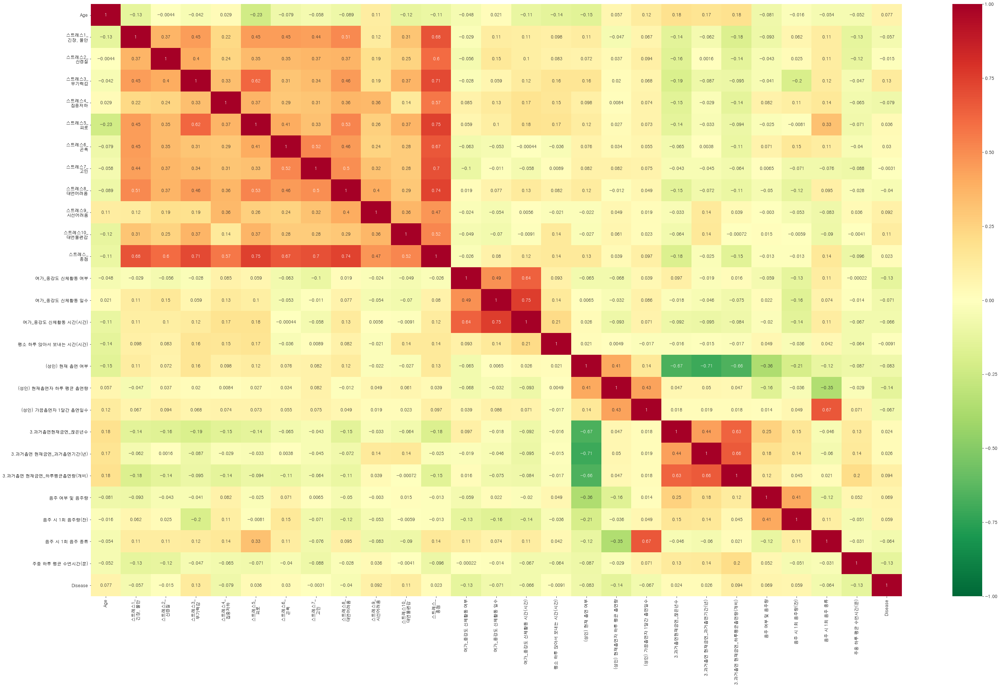

In [ ]:
import pandas as pd
data_p = pd.read_excel("./std_heart-master/Data/Data_ .xlsx", sheet_name='Pattern')
data_p['Disease']=disease
print("----- 데이터 info -----")
print(data_p.info())
data_p= data_p.drop(columns='여가_중강도 신체활동 시간(분)').copy()
print("-----데이터 변수명 -----")
print(data_p.columns, end='\n\n')

data_p[['3.과거흡연현재금연_끊은년수', '3.과거흡연 현재금연_과거흡연기간(년)','3.과거흡연 현재금연_하루평균흡연량(개비)']]=data_p[['3.과거흡연현재금연_끊은년수', '3.과거흡연 현재금연_과거흡연기간(년)','3.과거흡연 현재금연_하루평균흡연량(개비)']].fillna(0)
data_p['주중 하루 평균 수면시간(분)']=data_p['주중 하루 평균 수면시간(분)'].apply(pd.to_numeric, errors='coerce')
data_p.fillna(data_p['주중 하루 평균 수면시간(분)'].mean()) #결측치 평균값으로 체우기
mask = np.triu(np.ones_like(data_p.iloc[:,2:90].corr(), dtype=np.bool))
plt.figure(figsize=(50, 30))
sns.heatmap(data_p.iloc[:,2:90].corr(), mask=mask, annot=True, vmin=-1, vmax=1, center=0, cmap='RdYlGn_r')
plt.show()

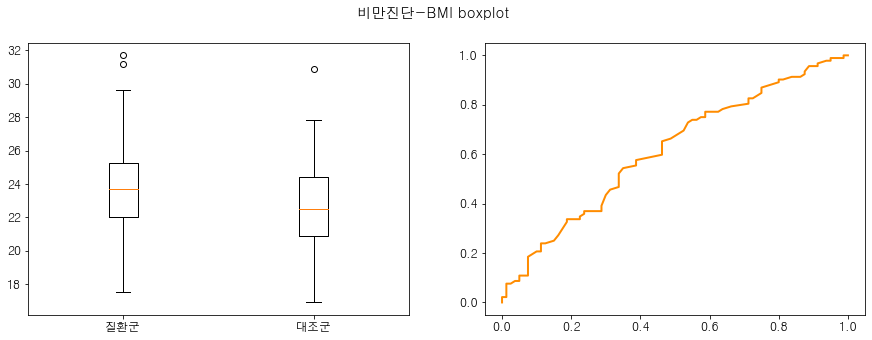


 ROC Curve : 0.614063 
 


 T-test-statistic : 2.678562 
 p-value : 0.008120


 질환군 Shapiro-Wilk-statistic : 0.987883 
 p-value : 0.560481


 대조군 Shapiro-Wilk-statistic : 0.987988 
 p-value : 0.663806


 Mann-Whitney-statistic : 2840.500000 
 p-value : 0.004996


 Levene-statistic : 0.056534 
 p-value : 0.812347



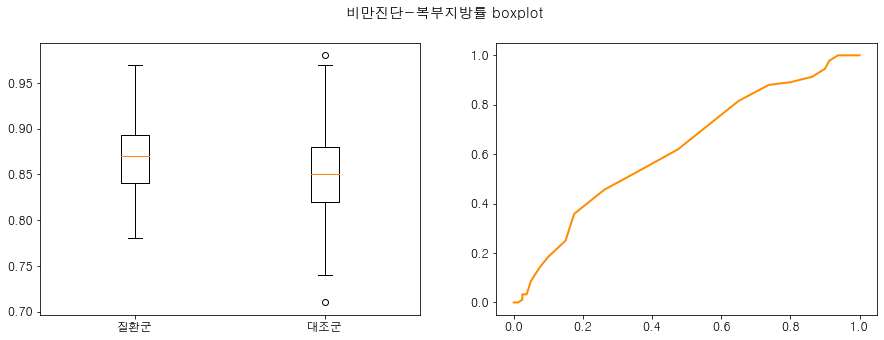


 ROC Curve : 0.622147 
 


 T-test-statistic : 2.793320 
 p-value : 0.005816


 질환군 Shapiro-Wilk-statistic : 0.986461 
 p-value : 0.463062


 대조군 Shapiro-Wilk-statistic : 0.981981 
 p-value : 0.320708


 Mann-Whitney-statistic : 2781.000000 
 p-value : 0.002840


 Levene-statistic : 0.466128 
 p-value : 0.495703



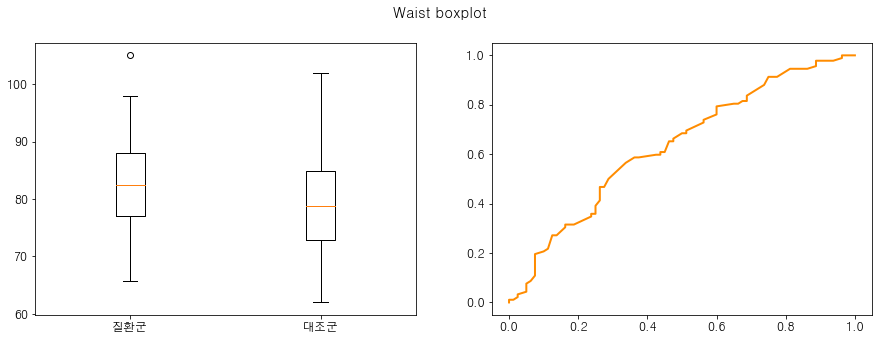


 ROC Curve : 0.633152 
 


 T-test-statistic : 2.986785 
 p-value : 0.003236


 질환군 Shapiro-Wilk-statistic : 0.993386 
 p-value : 0.931798


 대조군 Shapiro-Wilk-statistic : 0.984161 
 p-value : 0.427362


 Mann-Whitney-statistic : 2700.000000 
 p-value : 0.001314


 Levene-statistic : 0.212522 
 p-value : 0.645387



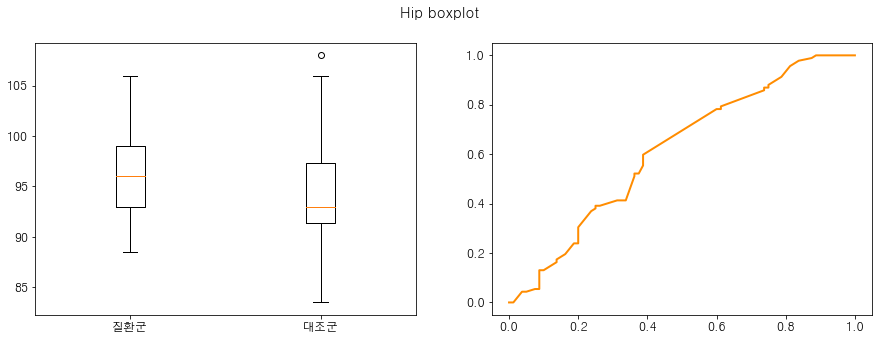


 ROC Curve : 0.614198 
 


 T-test-statistic : 2.383332 
 p-value : 0.018260


 질환군 Shapiro-Wilk-statistic : 0.960486 
 p-value : 0.006986


 대조군 Shapiro-Wilk-statistic : 0.964550 
 p-value : 0.025684


 Mann-Whitney-statistic : 2839.500000 
 p-value : 0.004903


 Levene-statistic : 0.697430 
 p-value : 0.404821



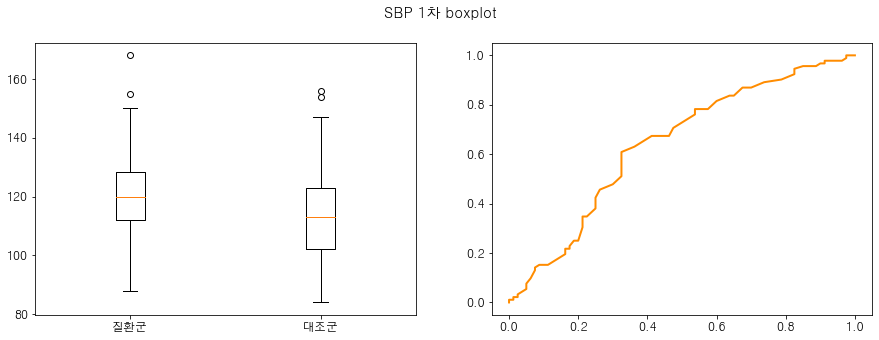


 ROC Curve : 0.639402 
 


 T-test-statistic : 2.959116 
 p-value : 0.003526


 질환군 Shapiro-Wilk-statistic : 0.990068 
 p-value : 0.722895


 대조군 Shapiro-Wilk-statistic : 0.971978 
 p-value : 0.075898


 Mann-Whitney-statistic : 2654.000000 
 p-value : 0.000819


 Levene-statistic : 0.766238 
 p-value : 0.382618



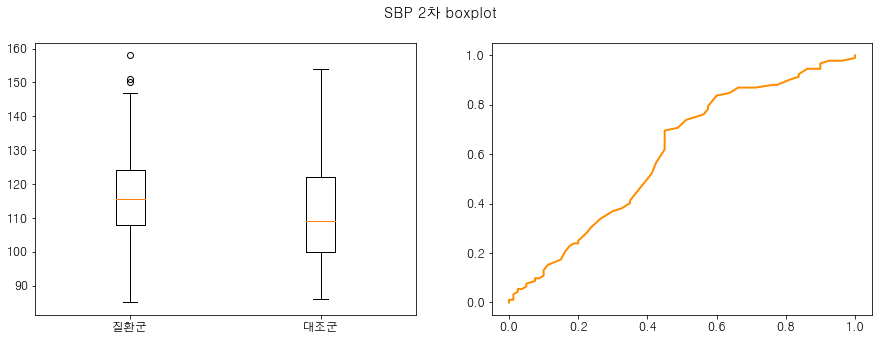


 ROC Curve : 0.603057 
 


 T-test-statistic : 2.227447 
 p-value : 0.027230


 질환군 Shapiro-Wilk-statistic : 0.985572 
 p-value : 0.407808


 대조군 Shapiro-Wilk-statistic : 0.968874 
 p-value : 0.048120


 Mann-Whitney-statistic : 2921.500000 
 p-value : 0.009962


 Levene-statistic : 1.651195 
 p-value : 0.200544



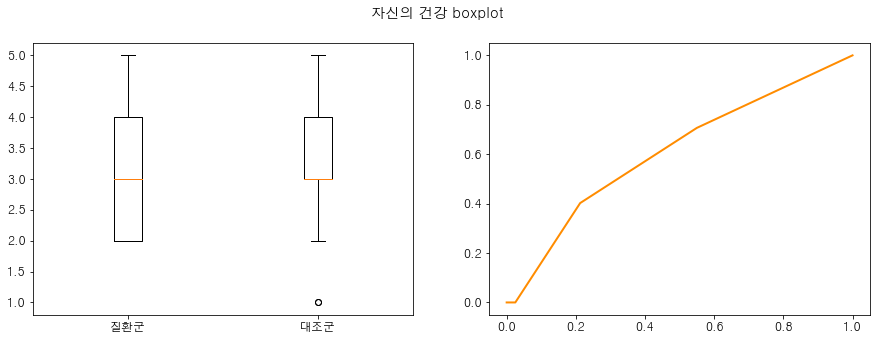


 ROC Curve : 0.608764 
 


 T-test-statistic : -2.458673 
 p-value : 0.014947


 질환군 Shapiro-Wilk-statistic : 0.821333 
 p-value : 0.000000


 대조군 Shapiro-Wilk-statistic : 0.879760 
 p-value : 0.000002


 Mann-Whitney-statistic : 2879.500000 
 p-value : 0.004919


 Levene-statistic : 0.012012 
 p-value : 0.912856



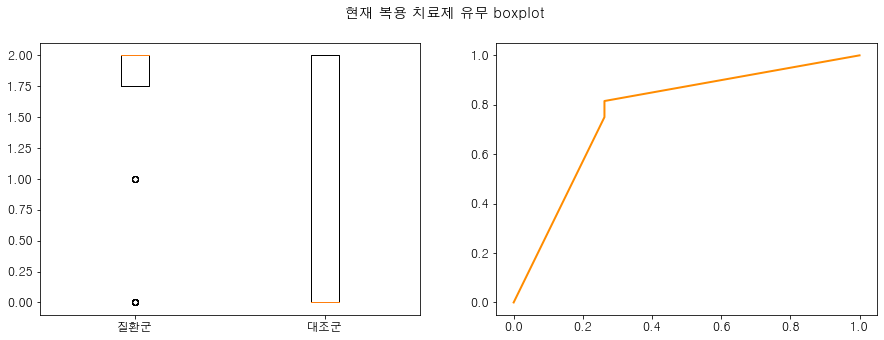


 ROC Curve : 0.767799 
 


 T-test-statistic : 8.148104 
 p-value : 0.000000


 질환군 Shapiro-Wilk-statistic : 0.555052 
 p-value : 0.000000


 대조군 Shapiro-Wilk-statistic : 0.548675 
 p-value : 0.000000


 Mann-Whitney-statistic : 1709.000000 
 p-value : 0.000000


 Levene-statistic : 0.499396 
 p-value : 0.480733



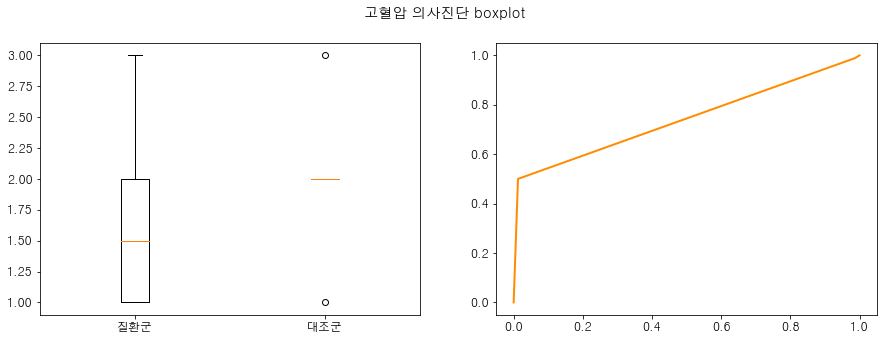


 ROC Curve : 0.741508 
 


 T-test-statistic : -8.030256 
 p-value : 0.000000


 질환군 Shapiro-Wilk-statistic : 0.675099 
 p-value : 0.000000


 대조군 Shapiro-Wilk-statistic : 0.175585 
 p-value : 0.000000


 Mann-Whitney-statistic : 1902.500000 
 p-value : 0.000000


 Levene-statistic : 584.277040 
 p-value : 0.000000



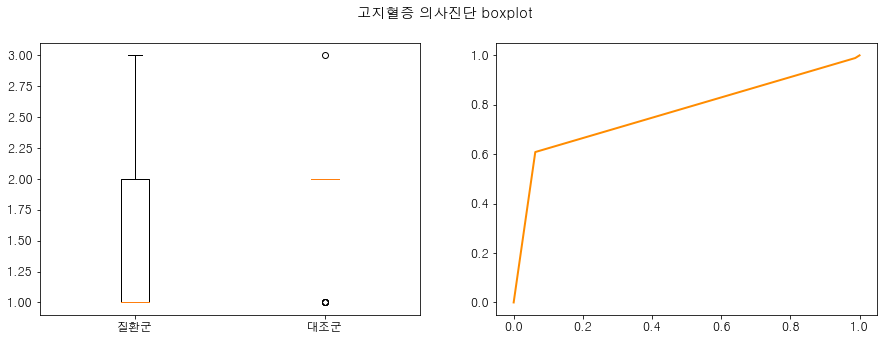


 ROC Curve : 0.770448 
 


 T-test-statistic : -8.542091 
 p-value : 0.000000


 질환군 Shapiro-Wilk-statistic : 0.651600 
 p-value : 0.000000


 대조군 Shapiro-Wilk-statistic : 0.337411 
 p-value : 0.000000


 Mann-Whitney-statistic : 1689.500000 
 p-value : 0.000000


 Levene-statistic : 26.244871 
 p-value : 0.000001



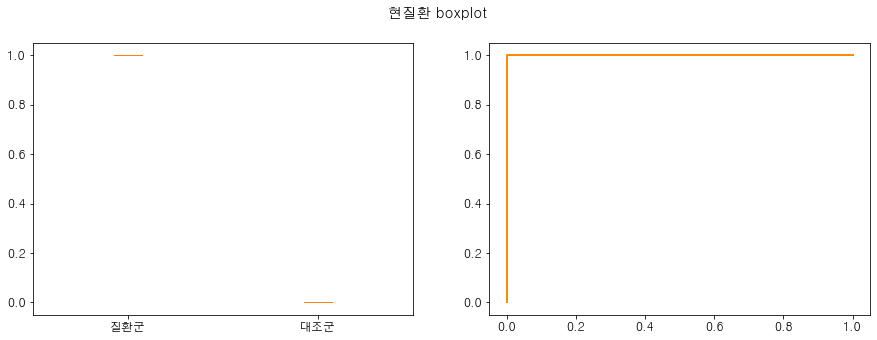


 ROC Curve : 1.000000 
 


 T-test-statistic : inf 
 p-value : 0.000000


 질환군 Shapiro-Wilk-statistic : 1.000000 
 p-value : 1.000000


 대조군 Shapiro-Wilk-statistic : 1.000000 
 p-value : 1.000000


 Mann-Whitney-statistic : 0.000000 
 p-value : 0.000000


 Levene-statistic : nan 
 p-value : nan



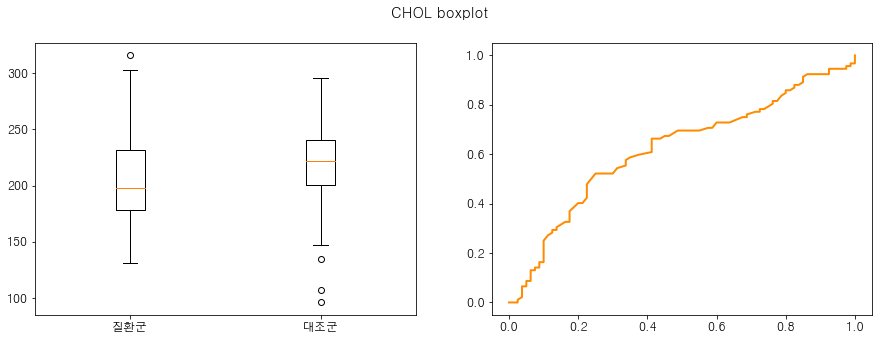


 ROC Curve : 0.620720 
 


 T-test-statistic : -2.134579 
 p-value : 0.034228


 질환군 Shapiro-Wilk-statistic : 0.973514 
 p-value : 0.057674


 대조군 Shapiro-Wilk-statistic : 0.970243 
 p-value : 0.058813


 Mann-Whitney-statistic : 2791.500000 
 p-value : 0.003202


 Levene-statistic : 0.395703 
 p-value : 0.530161



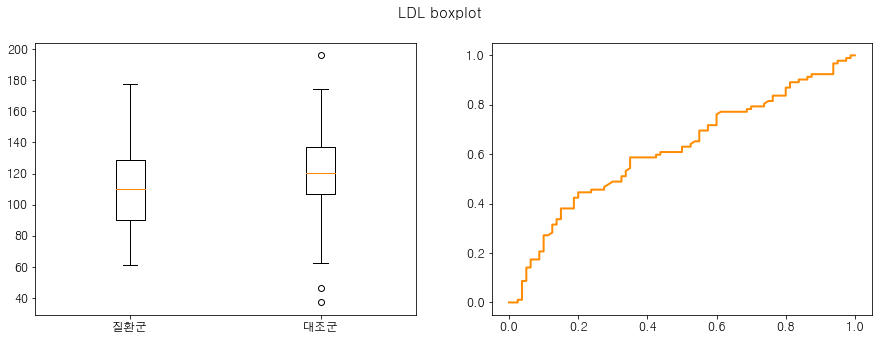


 ROC Curve : 0.617459 
 


 T-test-statistic : -2.349116 
 p-value : 0.019967


 질환군 Shapiro-Wilk-statistic : 0.976956 
 p-value : 0.102553


 대조군 Shapiro-Wilk-statistic : 0.982270 
 p-value : 0.333492


 Mann-Whitney-statistic : 2815.500000 
 p-value : 0.003996


 Levene-statistic : 0.217651 
 p-value : 0.641433



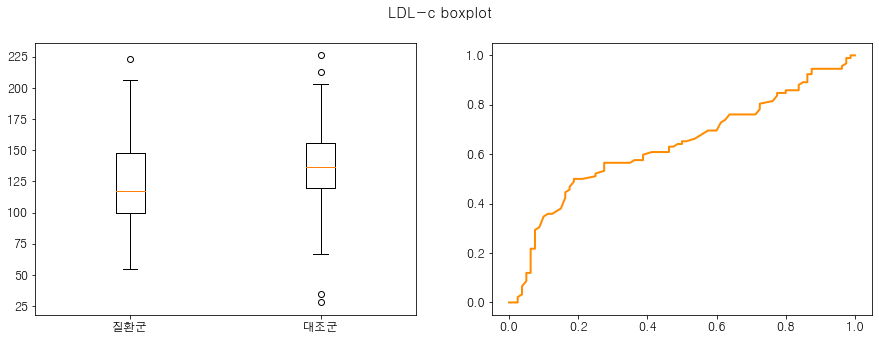


 ROC Curve : 0.635122 
 


 T-test-statistic : -2.562978 
 p-value : 0.011245


 질환군 Shapiro-Wilk-statistic : 0.972702 
 p-value : 0.050374


 대조군 Shapiro-Wilk-statistic : 0.968318 
 p-value : 0.044360


 Mann-Whitney-statistic : 2685.500000 
 p-value : 0.001137


 Levene-statistic : 0.827467 
 p-value : 0.364294



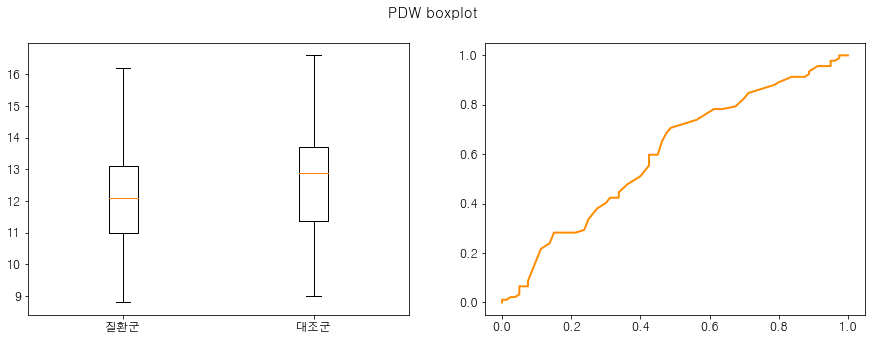


 ROC Curve : 0.600340 
 


 T-test-statistic : -2.158737 
 p-value : 0.032273


 질환군 Shapiro-Wilk-statistic : 0.980557 
 p-value : 0.186200


 대조군 Shapiro-Wilk-statistic : 0.989789 
 p-value : 0.781942


 Mann-Whitney-statistic : 2941.500000 
 p-value : 0.011718


 Levene-statistic : 0.931749 
 p-value : 0.335780



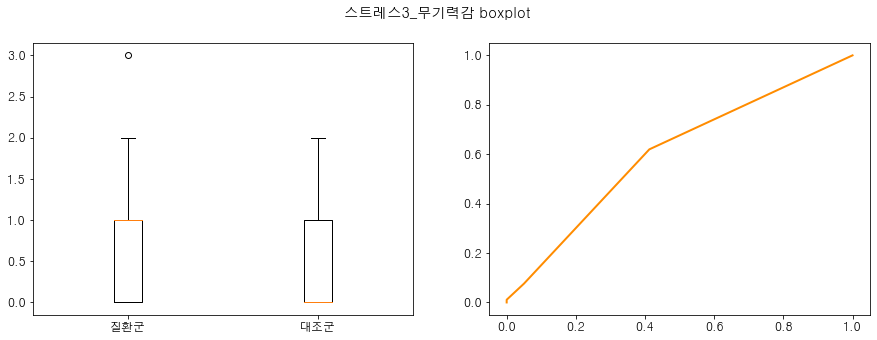


 ROC Curve : 0.604008 
 


 T-test-statistic : 2.582217 
 p-value : 0.010659


 질환군 Shapiro-Wilk-statistic : 0.760011 
 p-value : 0.000000


 대조군 Shapiro-Wilk-statistic : 0.696598 
 p-value : 0.000000


 Mann-Whitney-statistic : 2914.500000 
 p-value : 0.004211


 Levene-statistic : 0.003297 
 p-value : 0.954280



In [ ]:
from scipy.stats import ttest_ind, shapiro, mannwhitneyu, levene, kstest, f_oneway
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp
from sklearn.svm import SVC
from sklearn.metrics import roc_auc_score


Cat1 = data[data['현질환']==1]
Cat2 = data[data['현질환']==0]

for column in data.columns.to_list()[5:-1]:
    X = np.array(data[column]).reshape(-1,1)
    y = data.loc[:, '현질환'].values
    random_state = np.random.RandomState(0)
    model = OneVsRestClassifier(SVC(kernel='linear', probability=True,random_state=random_state))

    model.fit(X,y)
    y_score=model.decision_function(X)
    fpr, tpr, _ = roc_curve(y, y_score)
    if roc_auc_score(y, y_score) > 0.6:
        fig,ax = plt.subplots(1,2,figsize=(15,5))
        plt.suptitle('{} boxplot'.format(column))
        ax[0].boxplot((Cat1[column].to_numpy(),Cat2[column].to_numpy()),sym="o", labels=["질환군","대조군"])
        ax[1].plot(fpr, tpr, color='darkorange',lw=2,label='ROC curve')
        plt.show()
    
        print("\n ROC Curve : %f \n "%roc_auc_score(y, y_score),end='\n\n')    
        print("\n T-test-statistic : %f \n p-value : %f"%ttest_ind(Cat1[column], Cat2[column]),end='\n\n')
        print("\n 질환군 Shapiro-Wilk-statistic : %f \n p-value : %f"%shapiro(Cat1[column]),end='\n\n')
        print("\n 대조군 Shapiro-Wilk-statistic : %f \n p-value : %f"%shapiro(Cat2[column]),end='\n\n')
        print("\n Mann-Whitney-statistic : %f \n p-value : %f"%mannwhitneyu(Cat1[column], Cat2[column]),end='\n\n')
        print("\n Levene-statistic : %f \n p-value : %f"%levene(Cat1[column], Cat2[column]),end='\n\n')
#       print("\n 대조군 Kolmogorov-Smirnov -statistic : %f \n p-value : %f"%kstest(Cat1[column],'norm'),end='\n\n')
#       print("\n 질환군 Kolmogorov-Smirnov -statistic : %f \n p-value : %f"%kstest(Cat2[column],'norm'),end='\n\n')

              precision    recall  f1-score   support

   Disease 0       0.60      0.67      0.63        18
   Disease 1       0.68      0.62      0.65        21

    accuracy                           0.64        39
   macro avg       0.64      0.64      0.64        39
weighted avg       0.65      0.64      0.64        39

----- Random Forest(MDI) -----
최고 평균 정확도 :  0.6227920227920227
최고 파라미터 :  {'max_depth': 5, 'min_samples_split': 20, 'n_estimators': 800}

              precision    recall  f1-score   support

   Disease 0       0.54      0.78      0.64        18
   Disease 1       0.69      0.43      0.53        21

    accuracy                           0.59        39
   macro avg       0.62      0.60      0.58        39
weighted avg       0.62      0.59      0.58        39

F1: [0.65 0.65 0.65 0.65 0.65]


  0%|          | 0/39 [00:00<?, ?it/s]

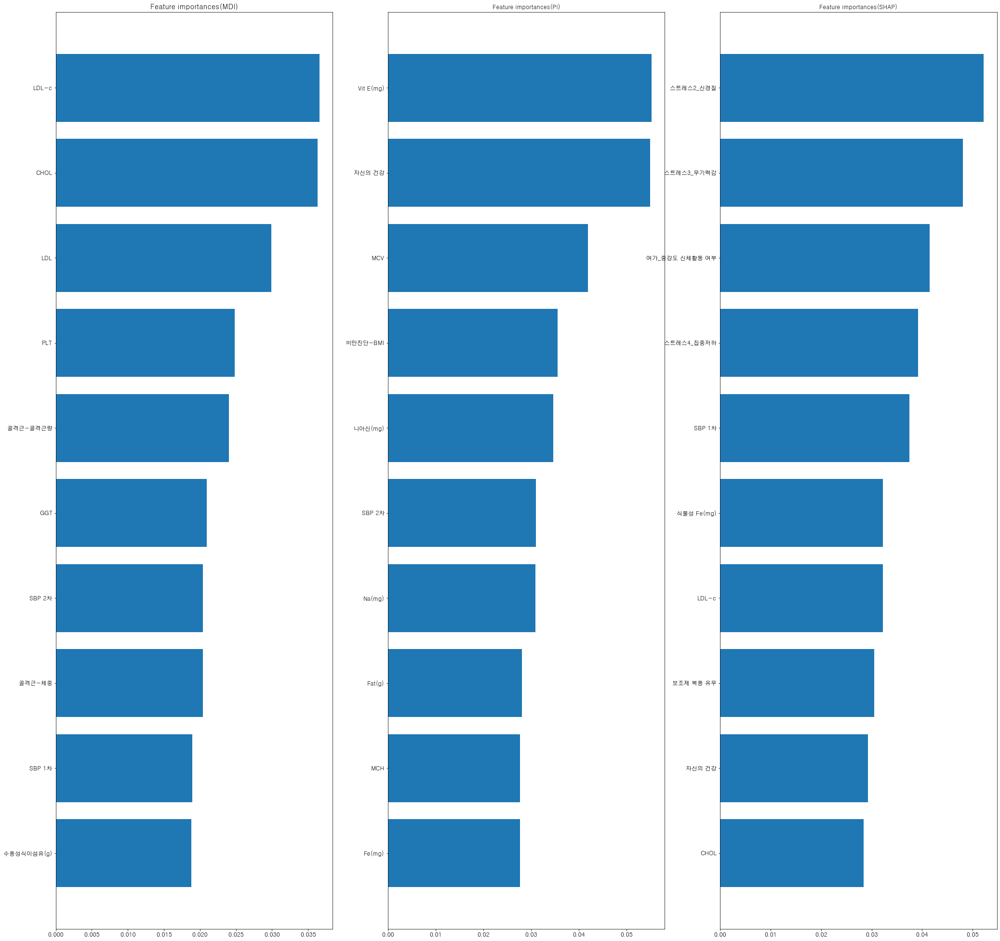

In [ ]:
### RAW 데이터 불러오기 ###
# KS모델의 KNN 모델

### train/test ###
from sklearn.model_selection import train_test_split

#X = new_data.copy()
X = data.drop(columns=['현질환']).copy()
y = data.loc[:, '현질환'].values

x_train, x_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.222, random_state=42)

### normalization ###
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
x_ = scaler.fit_transform(X)
x_train = scaler.fit_transform(x_train)
x_test = scaler.fit_transform(x_test)

### KNN classification ###
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import classification_report
estimator_KNN = KNeighborsClassifier()
parameters_KNN = {
            'n_neighbors': range(1,20),
            'weights': ('uniform', 'distance'),
            'metric': ('minkowski', 'chebyshev','euclidean',),
            'p':[1,2],
            'algorithm':('auto','kd_tree','ball_tree')      
            }
        
# GridSearchCV 파라미터 탐색
kfold = KFold(n_splits=5, shuffle=True, random_state=7)

grid_knn = GridSearchCV(
            estimator=estimator_KNN,
            param_grid=parameters_KNN,
            scoring = 'f1',  #'f1','roc_auc','accuracy'
            cv=kfold
          )

grid_knn.fit(x_train,  y_train)
knn=KNeighborsClassifier().set_params(**grid_knn.best_params_)
knn.fit(x_train,y_train)
y_pred = knn.predict(x_test)
print(classification_report(y_test, y_pred, target_names=['Disease 0', 'Disease 1']))



## 랜덤포레스트 변수 중요도 평가 결과 시각화 (MDI)
fig,ax = plt.subplots(1,3,figsize=(35,35))

## GridSearchCV
print("----- Random Forest(MDI) -----")
rf_model = RandomForestClassifier()
rf_param = {
    'n_estimators':[500, 800],
    'max_depth':[5,6,8,10],
    'min_samples_split':[10,20,30],
}
rf_grid = GridSearchCV(rf_model, param_grid=rf_param, scoring='accuracy')
rf_grid.fit(x_train, y_train)
print('최고 평균 정확도 : ', rf_grid.best_score_)
print('최고 파라미터 : ', rf_grid.best_params_,end='\n\n')

## 랜덤포레스트 모델 구축
from sklearn import metrics
model = RandomForestClassifier().set_params(**rf_grid.best_params_)
model.fit(x_train, y_train)

pred = model.predict(x_test)
print(classification_report(y_test, pred, target_names=['Disease 0', 'Disease 1']))

y_pred = model.predict(X)
import matplotlib.pyplot as plt
importance_mdi = pd.DataFrame({'feature':X.columns, 'importance':model.feature_importances_}).sort_values(by='importance', ascending=False)

ax[0].set_title("Feature importances(MDI)")
ax[0].barh(y=importance_mdi.iloc[:10]['feature'], width =importance_mdi.iloc[:10]['importance'])
ax[0].invert_yaxis()


## Permutaion Importance 변수 중요도 체크
import eli5
from eli5.sklearn import PermutationImportance
import matplotlib.pyplot as plt
import warnings
import matplotlib as mpl
warnings.filterwarnings(action='ignore')

from matplotlib import font_manager, rc
font_manager.get_fontconfig_fonts()
font_name = font_manager.FontProperties(fname='C:\windows\Fonts\H2GTRM.TTF').get_name()
#plt.rcParams["font.family"] = font_name
rc('font', family=font_name)
mpl.rcParams['axes.unicode_minus'] = False
plt.rcParams['font.size']=10

perm = PermutationImportance(knn, scoring='f1', random_state=0).fit(x_test, y_test)
print('F1:', perm.scores_)
#eli5.show_weights(perm, feature_names = X.columns.tolist(), show_feature_values=True) # Permutation Importance

# eli5 변수 중요도 출력하기
weight = eli5.explain_weights_df(perm, feature_names = X.columns.tolist())
weight_col = weight.feature
importance_pi = pd.DataFrame({'feature' : weight_col, 
                           'importance' : weight.weight[:10]}).sort_values(by='importance', ascending=False)

ax[1].set_title("Feature importances(PI)")
ax[1].barh(y=importance_pi.iloc[:10]['feature'], width =importance_pi.iloc[:10]['importance'])
ax[1].invert_yaxis()


## SHAP value
import shap

shap.initjs()
x_test_ = pd.DataFrame(x_test,columns=X.columns)

explainer = shap.KernelExplainer(knn.predict, x_test_)
shap_values = explainer.shap_values(x_test_)
#shap.summary_plot(shap_values,ax=ax[2], x_test_,plot_type='bar')

importance = {}
for i in range(len(X.columns)):
    importance[X.columns[i]] = abs(shap_values[:,i]).mean()

importance_shap = pd.DataFrame([importance]).iloc[0].sort_values(ascending=False).iloc[:10]
ax[2].set_title("Feature importances(SHAP)")
ax[2].barh(y=importance_shap.index.to_list(), width=importance_shap.values)
ax[2].invert_yaxis()

plt.show()

In [ ]:
importance_mdi = importance_mdi.iloc[:10]
importance_pi = importance_pi.iloc[:10]
importance_shap.name = 'importance'
importance_mdi = importance_mdi.set_index('feature')
importance_pi = importance_pi.set_index('feature')
importance_shap = pd.DataFrame(importance_shap)
importance_shap.index.name = 'feature'
importance_mdi['Score'] ,importance_pi['Score'] ,importance_shap['Score'] = 0, 0, 0
for i in range(10):
    print("MDI ", importance_mdi['importance'].index[i], (10-i))
    importance_mdi['Score'][i]=(10-i)
    print("PI ", importance_pi['importance'].index[i], (10-i))
    importance_pi['Score'][i]=(10-i)
    print("SHAP ", importance_shap['importance'].index[i], (10-i))
    importance_shap['Score'][i]=(10-i)
    print("\n")

result = pd.concat([importance_mdi['Score'],importance_pi['Score'],importance_shap['Score']],axis=1).fillna(0)
result.columns=['MDI','PI','SHAP']
total = pd.eval("total = result.MDI+result.PI+result.SHAP",target=result)
total.sort_values(by=['total'],ascending=False, inplace=True)

def get_outlier(df=None, column=None, weight=1.5):
  # target 값과 상관관계가 높은 열을 우선적으로 진행
    quantile_25 = np.percentile(df[column].values, 25)
    quantile_75 = np.percentile(df[column].values, 75)
    
    IQR = quantile_75 - quantile_25
    IQR_weight = IQR*weight
  
    lowest = quantile_25 - IQR_weight
    highest = quantile_75 + IQR_weight
    
    outlier_idx = df[column][ (df[column] < lowest) | (df[column] > highest) ].index
    
    return outlier_idx

<AxesSubplot:>

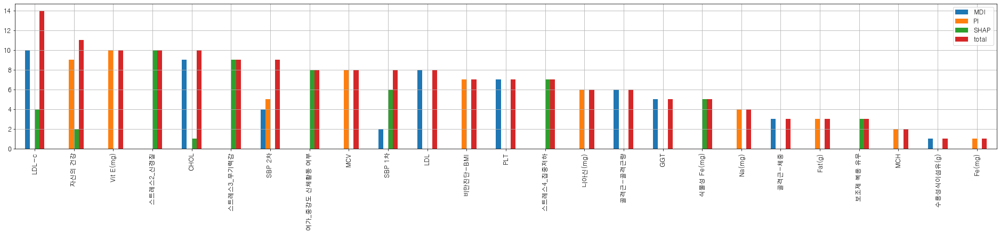

In [ ]:
total.plot.bar(figsize=(33,5),grid=True)

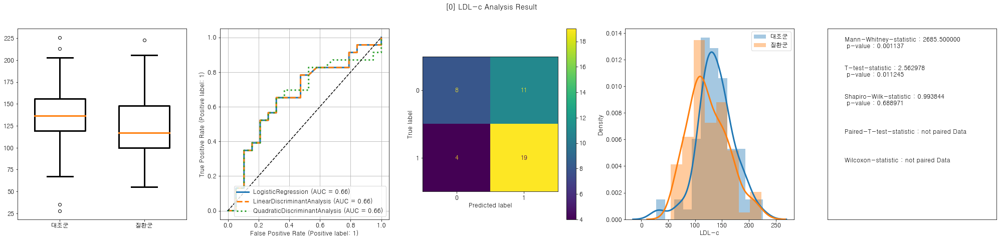

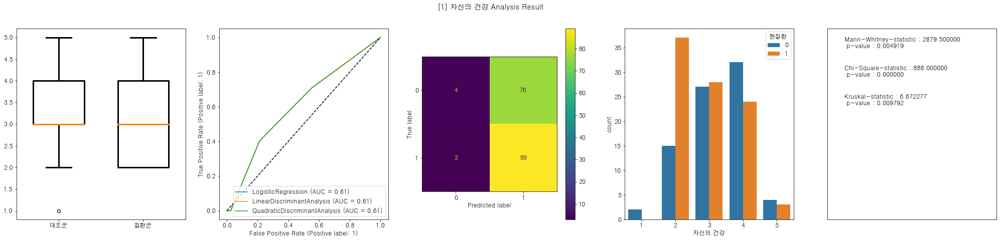

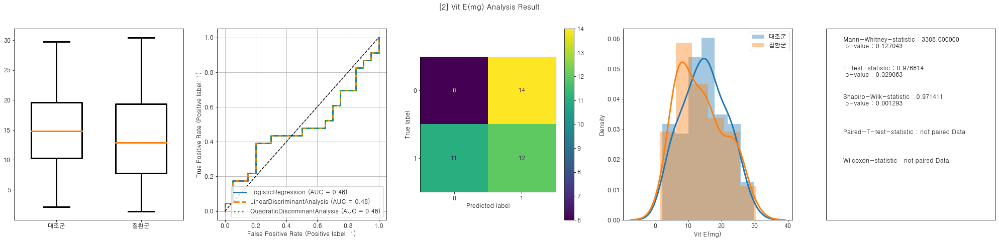

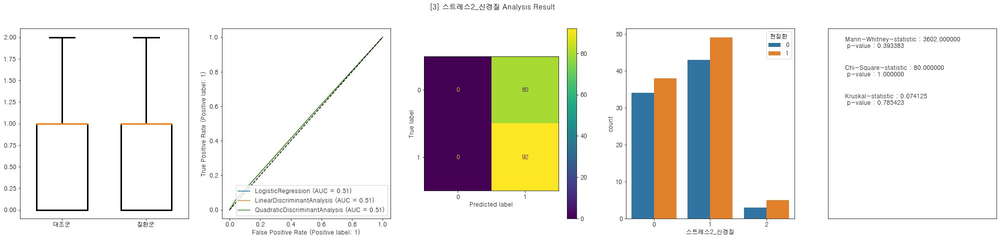

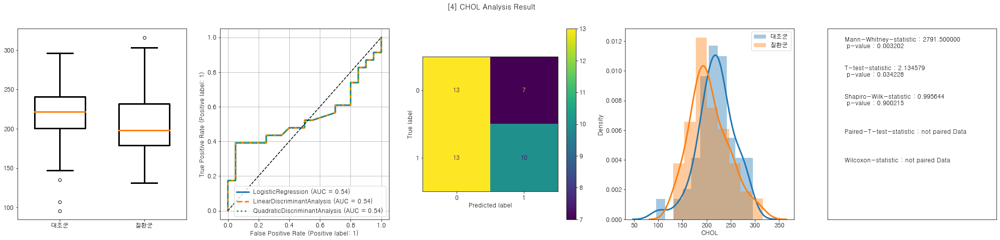

...

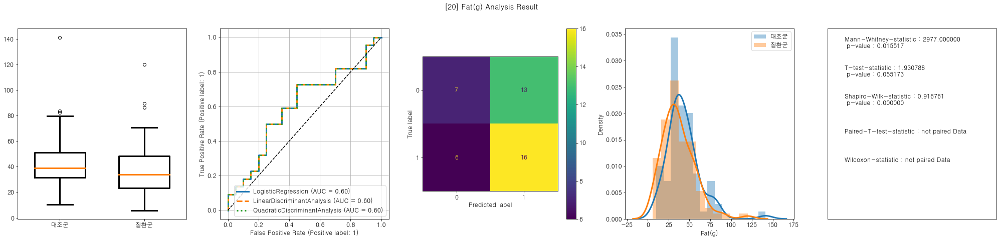

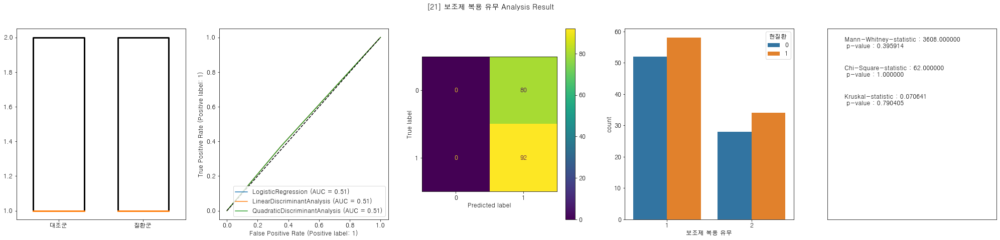

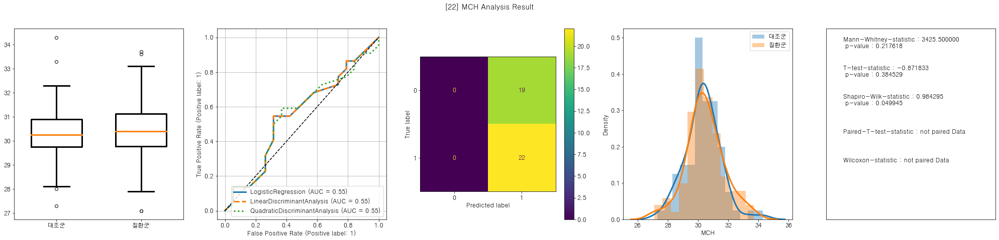

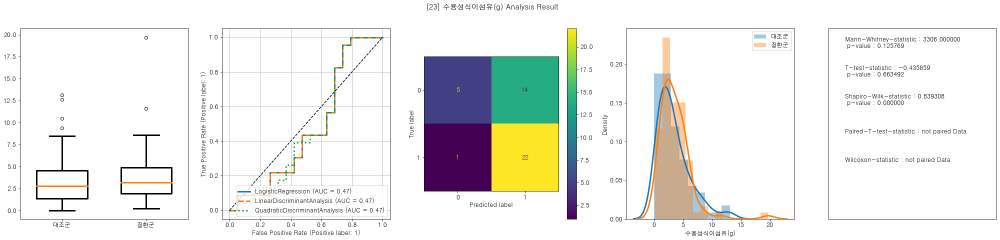

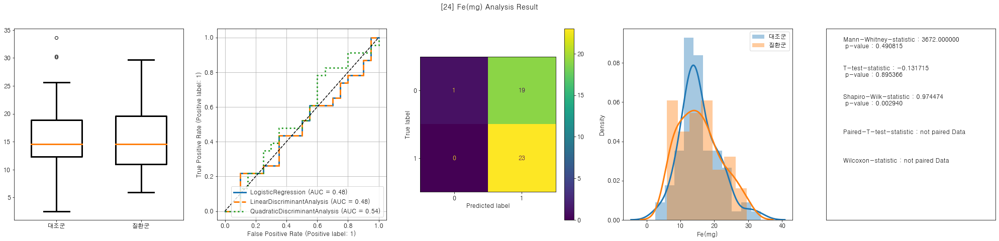

In [ ]:
from scipy.stats import *
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve
from sklearn.metrics import RocCurveDisplay
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import statsmodels as sm
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis, LinearDiscriminantAnalysis

props=dict(linewidth=3)
target='현질환'
for column in total.index:  
    if data[column].nunique() > 20:  # 항목 수가 20개 이상을 연속형 변수로 추정
        fig,ax = plt.subplots(1,5,figsize=(35,7))
        plt.suptitle('[{}] {} Analysis Result'.format(total.index.to_list().index(column),column))
        X = data.drop(get_outlier(data, column))[column].copy()
        y = data.loc[X.index,target].values
        X = X.values.reshape(-1,1)
        
        X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y)
        clf =  LogisticRegression(penalty='l2',C=0.01,random_state=0).fit(X_train, y_train)

        LDA = LinearDiscriminantAnalysis()
        LDA.fit(X_train, y_train)
        QDA = QuadraticDiscriminantAnalysis()
        QDA.fit(X_train, y_train)

        y_score = clf.predict(X_test)
        text1="Mann-Whitney-statistic : %f \n p-value : %f"%mannwhitneyu(data[column][data[target]==0], data[column][data[target]==1]) # 순위합
        text2="T-test-statistic : %f \n p-value : %f"%ttest_ind(data[column][data[target]==0], data[column][data[target]==1]) # 평균차이
        text3="Shapiro-Wilk-statistic : %f \n p-value : %f"%shapiro(data[column]) # 정규성
        if len(data[column][data[target]==0]) == len(data[column][data[target]==1]):
            text4="Paired-T-test-statistic : %f \n p-value : %f"%ttest_rel(data[column][data[target]==0], data[column][data[target]==1]) # paired ttest
            text5="Wilcoxon-statistic : %f \n p-value : %f"%wilcoxon(data[column][data[target]==0], data[column][data[target]==1]) # 윌콕슨
        else:
            text4 = "Paired-T-test-statistic : not paired Data"
            text5 = "Wilcoxon-statistic : not paired Data"
        
        ax[0].boxplot((data[column][data[target]==0],data[column][data[target]==1]),sym="o", labels=["대조군","질환군"],
                      widths=.6, boxprops=props, whiskerprops=props, capprops=props, medianprops=props)
        metrics.plot_roc_curve(clf, X_test, y_test,ax=ax[1],lw=3)
        metrics.plot_roc_curve(LDA, X_test, y_test,ax=ax[1],ls='--',lw=3)
        metrics.plot_roc_curve(QDA, X_test, y_test,ax=ax[1],ls=':',lw=3)
        ax[1].plot([0,1], [0,1], linestyle='--', markersize=0.01, color='black')
        ax[1].grid(True)
        cm_display = ConfusionMatrixDisplay(confusion_matrix(y_test, y_score)).plot(ax=ax[2])
        sns.distplot( data[column][data[target]==0], ax=ax[3], label='대조군', kde_kws=props)
        sns.distplot( data[column][data[target]==1], ax=ax[3], label='질환군', kde_kws=props)
        ax[3].legend()
        ax[4].text(0.1,.9,text1)
        ax[4].text(0.1,.75,text2)
        ax[4].text(0.1,.6,text3)
        ax[4].text(0.1,.45,text4)
        ax[4].text(0.1,.3,text5)
        ax[4].axes.xaxis.set_visible(False)
        ax[4].axes.yaxis.set_visible(False)
    else:   # 항목 수 20개 이하를 이산형(범주형) 변수로 추정
        fig,ax = plt.subplots(1,5,figsize=(35,7))
        plt.suptitle('[{}] {} Analysis Result'.format(total.index.to_list().index(column),column))
        X = data[column].values.reshape(-1,1)
        y = data[target].values
        X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y)
        clf =  LogisticRegression(penalty='l2',C=0.01,random_state=0).fit(X, y)

        LDA = LinearDiscriminantAnalysis()
        LDA.fit(X, y)
        QDA = QuadraticDiscriminantAnalysis()
        QDA.fit(X, y)
        
        y_score = clf.predict(X)
        text1="Mann-Whitney-statistic : %f \n p-value : %f"%mannwhitneyu(data[column][data[target]==0], data[column][data[target]==1])
        text2="Chi-Square-statistic : %f \n p-value : %f"%chisquare(data[column],1)
        text3="Kruskal-statistic : %f \n p-value : %f"%kruskal(data[column][data[target]==0], data[column][data[target]==1])
        ax[0].boxplot((data[column][data[target]==0],data[column][data[target]==1]),sym="o", labels=["대조군","질환군"],
                      widths=.6,boxprops=props, whiskerprops=props, capprops=props, medianprops=props)
        metrics.plot_roc_curve(clf, X, y,ax=ax[1])
        metrics.plot_roc_curve(LDA, X, y,ax=ax[1])
        metrics.plot_roc_curve(QDA, X, y,ax=ax[1])
        ax[1].plot([0,1], [0,1], linestyle='--', markersize=0.01, color='black')
        cm_display = ConfusionMatrixDisplay(confusion_matrix(y, y_score)).plot(ax=ax[2])
        sns.countplot(x=column,hue=target, data=data, ax=ax[3])
        ax[4].text(0.1,.9,text1)
        ax[4].text(0.1,.75,text2)
        ax[4].text(0.1,.6,text3)
        ax[4].axes.xaxis.set_visible(False)
        ax[4].axes.yaxis.set_visible(False)


In [ ]:
data = pd.read_excel("./Data/Dataset_ .xlsx")

# 데이터 수정
data['(성인) 현재 흡연 여부']=data['(성인) 현재 흡연 여부'].replace({3:1,1:3}).copy()
data['현재 복용 치료제 유무']=data['현재 복용 치료제 유무'].replace({2:0,1:2,3:1}).copy()
data['보조제 복용 유무']=data['보조제 복용 유무'].replace({2:1,1:2}).copy()

# 필요없는 columns 제거 
data= data.drop(columns=['NO', 'Unnamed: 0']).copy()

# 자가문진 가능한 11개 columns(현재 복용 치료제 유무 제거시)
cate_data=data.loc[:,['규칙적 운동 여부', '보조제 복용 유무', '스트레스3_무기력감', '스트레스2_신경질',#'현재 복용 치료제 유무',
         '여가_중강도 신체활동 여부', '자신의 건강', '스트레스5_피로','음주 여부 및 음주량', 
         '스트레스1_긴장, 불안','스트레스8_대면어려움','스트레스9_시선어려움']].copy()

# 연속형 변수 columns 22개
cont_data=data.loc[:,['SBP 2차','DBP 1차','SBP 1차','Vit E(mg)','HDL','LDL','LDL-c','HCT','CHOL','회분(g)','식물성 Fe(mg)',
                'HGB','비만진단-복부지방률','Mo(ug)','RBC','MONO','VitB2(mg)','동물성 단백질(g)','Cu(ug)','Vit C(mg)','Protein(g)','WBC']].copy()

# 범주형 데이터 columns
cate_columns = ['Sex', '보조제 복용 유무', '자신의 건강', '현재 복용 치료제 유무',  '현재 복용 치료제 종류',
                           '규칙적 운동 여부', '고혈압 의사진단','고지혈증 의사진단', 
                           '스트레스1_긴장, 불안', '스트레스2_신경질', '스트레스3_무기력감', '스트레스4_집중저하', '스트레스5_피로', 
                           '스트레스6_곤욕', '스트레스7_고민', '스트레스8_대면어려움', '스트레스9_시선어려움', '스트레스10_대면불편감', 
                           '여가_중강도 신체활동 여부', '여가_중강도 신체활동 일수', '여가_중강도 신체활동 시간(시간)', '여가_중강도 신체활동 시간(분)',
                           '평소 하루 앉아서 보내는 시간(시간)', '(성인) 현재 흡연 여부', '(성인) 현재흡연자 하루 평균 흡연량', '(성인) 가끔흡연자 1달간 흡연일수', 
                           '3.과거흡연현재금연_끊은년수', '3.과거흡연 현재금연_과거흡연기간(년)', '3.과거흡연 현재금연_하루평균흡연량(개비)', '음주 여부 및 음주량', 
                           '음주 시 1회 음주량(잔)', '음주 시 1회 음주 종류']
# 범주형만 제거된 데이터
new_data = data.drop(columns=cate_columns).copy()
print(len(cate_columns), new_data.shape)

bind_data = cont_data.apply(lambda x: pd.cut(x,bins=np.histogram(x, bins=12,)[1],labels=False),axis=0).fillna(0).copy()


X = pd.concat([cate_data,bind_data],axis=1).copy()

y = data.loc[:, '현질환'].values

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.222, random_state=17) 
scaler = MinMaxScaler()
x_ = scaler.fit_transform(X)
x_train = scaler.fit_transform(x_train)
x_test = scaler.fit_transform(x_test)

estimator_KNN = KNeighborsClassifier()
parameters_KNN = {
            'n_neighbors': range(1,20),
            'p': (1,2),
            'weights': ('uniform', 'distance'),
            'metric': ('minkowski', 'chebyshev','euclidean','manhattan'),
            'algorithm':('auto','kd_tree','ball_tree','brute')      
            }
        
# GridSearchCV 파라미터 탐색
kfold = KFold(n_splits=5, shuffle=True, random_state=7)

grid_search_KNN = GridSearchCV(
            estimator=estimator_KNN,
            param_grid=parameters_KNN,
            scoring = 'f1',  #'f1','roc_auc','accuracy'
            cv=kfold
          )

grid_search_KNN.fit(x_train,y_train)
y_pred=grid_search_KNN.predict(x_test)

x_ = pd.DataFrame(x_, columns=X.columns) 
x_train = pd.DataFrame(x_train, columns=X.columns)
x_test = pd.DataFrame(x_test, columns=X.columns)


clustering = shap.utils.hclust(x_train, y_train)
masker = shap.maskers.Partition(x_train, clustering=clustering)

explainer = shap.explainers.Permutation(grid_search_KNN.predict_proba,masker)
shap_values2 = explainer(x_train)
shap_values2 = shap_values2[...,1]

32 (172, 91)
34it [00:10,  3.62s/it]
Permutation explainer: 134it [00:47,  2.23it/s]


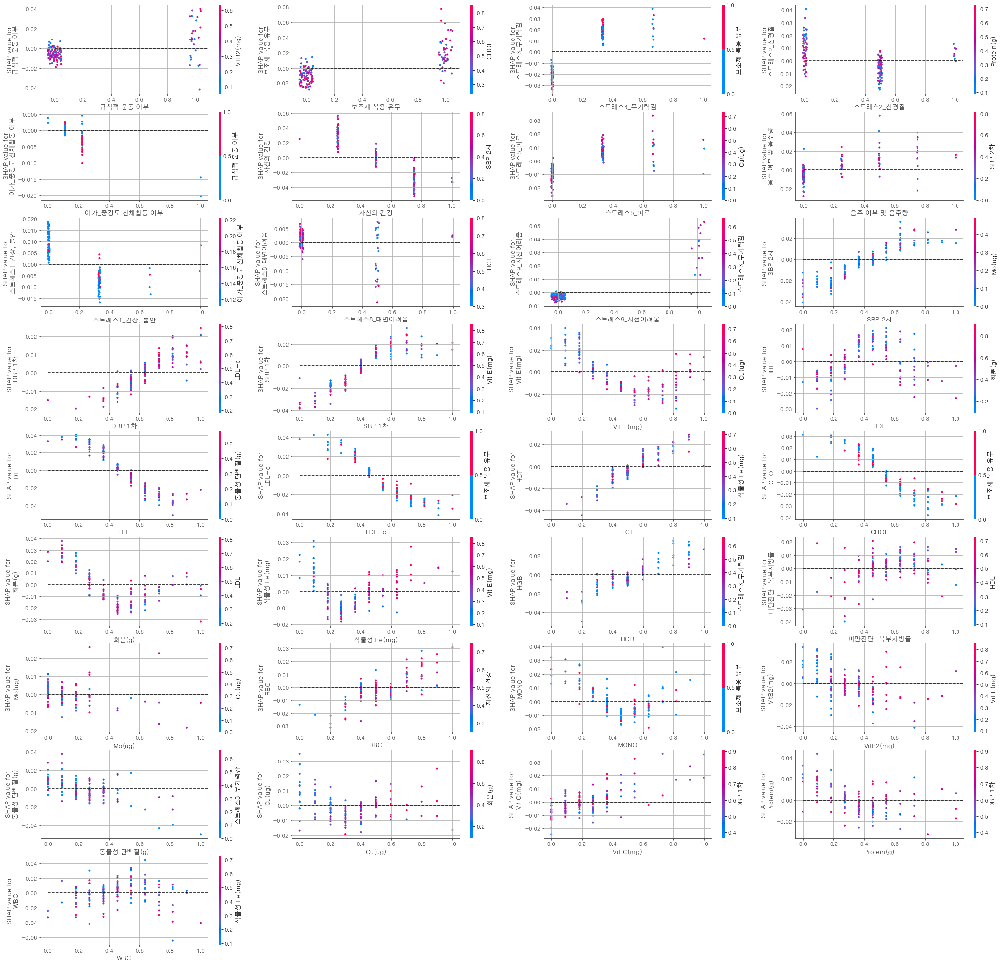

In [ ]:
import statsmodels.api as sm

# 각 변수 별 shap value 변화를 Linear Regression을 통하여 value가 0이 되는 구간을 찾음. *11 +1
ax = plt.figure(figsize=(35,35))
for i in range(33):    
    shap.plots.scatter(shap_values2[:,i],ax=ax.add_subplot(9,4,i+1,),show=False,hist=False,color=shap_values2)
    plt.plot(np.arange(0,12),np.arange(0,12)*0,color='k',linestyle='--')
    plt.grid(which='major')
plt.show()

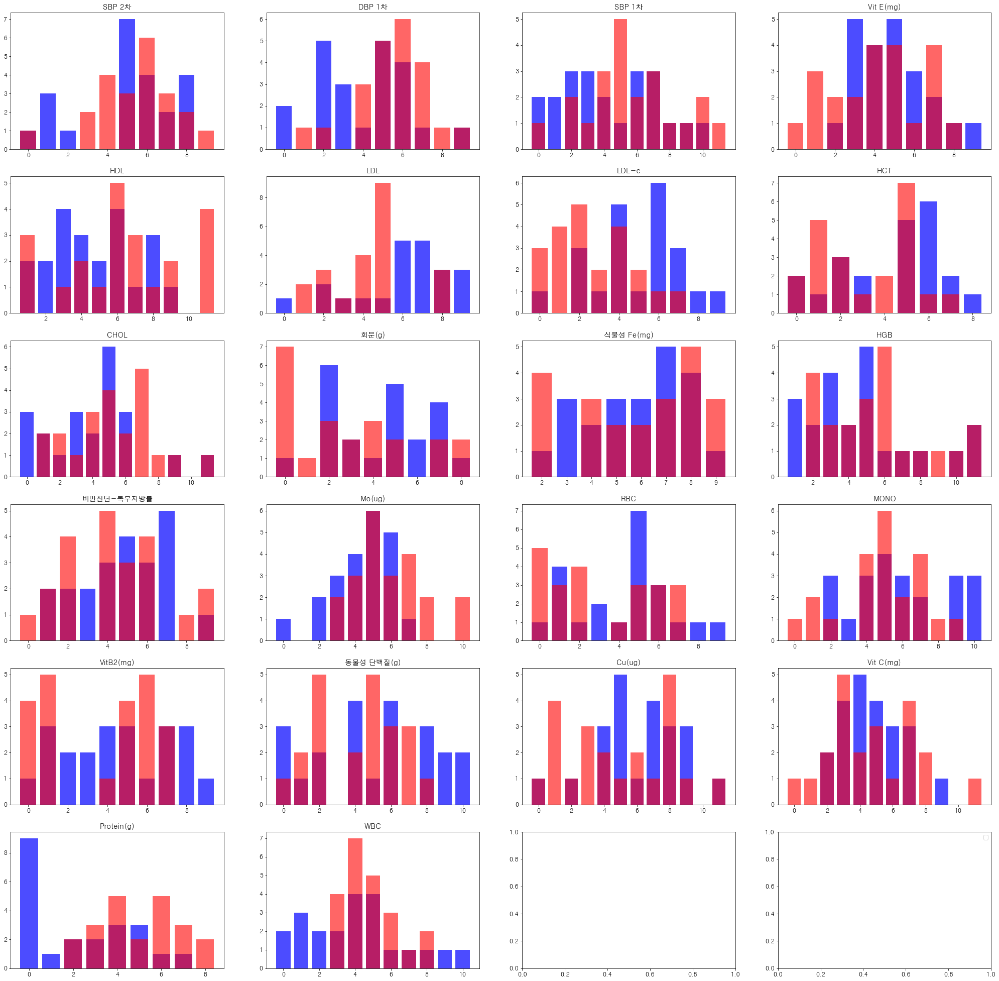

In [ ]:
bind_data = cont_data.apply(lambda x: pd.cut(x,bins=np.histogram(x, bins=12)[1],labels=False),axis=0).fillna(0).copy()
fig,ax = plt.subplots(6,4,figsize=(35,35))
ax = ax.ravel()
# 12구간으로 나누었을 때, 질환자와 대조군과의 분포 히스토그램
for i in range(22):
    ax[i].bar(bind_data[data['현질환']==0].iloc[i].value_counts().keys(),bind_data[data['현질환']==0].iloc[i].value_counts().values,color='b',alpha=.7)
    ax[i].bar(bind_data[data['현질환']==1].iloc[i].value_counts().keys(),bind_data[data['현질환']==1].iloc[i].value_counts().values,color='r',alpha=.6)
    ax[i].set_title(bind_data.iloc[:,i].name)
    if i == 22:
        break
plt.legend(ax,['정상','질환'])
plt.show()

  0%|          | 0/39 [00:00<?, ?it/s]

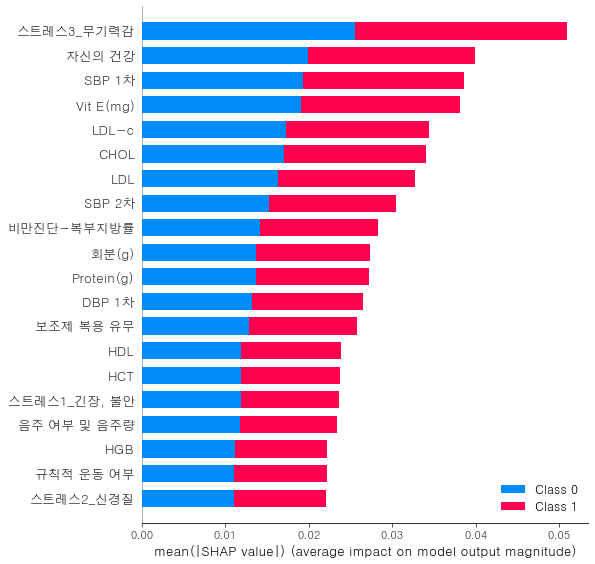

In [ ]:
# shap value 변화 확인
shap.initjs()
x_test_ = pd.DataFrame(x_test,columns=X.columns)

explainer = shap.KernelExplainer(grid_search_KNN.predict_proba, x_test_,output_names=X.columns.to_list())
shap_values = explainer.shap_values(x_test_)
shap.summary_plot(shap_values, x_test_,
                 max_display=20, plot_type='bar',)

In [ ]:
bind_data = cont_data.apply(lambda x: pd.cut(x,bins=np.histogram(x, bins=12,)[1],labels=False),axis=0).fillna(0).copy()

# bind_data에 어느 columns를 추가하여 결과를 볼 지 선택
X = pd.concat([cate_data,bind_data],axis=1).copy()
#X = pd.concat([bind_data,data.loc[:,cate_columns].copy()],axis=1).drop(columns=['현질환','고혈압 의사진단','고지혈증 의사진단','현재 복용 치료제 유무']).copy()
#X = cont_data.copy()
y = data.loc[:, '현질환'].values

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.222, random_state=17) 
scaler = MinMaxScaler()# Normalizer(), MaxAbsScaler(),StandardScaler(), MinMaxScaler()
x_ = scaler.fit_transform(X)
#x_train = scaler.fit_transform(x_train)
#x_test = scaler.fit_transform(x_test)

estimator_KNN = KNeighborsClassifier(11)
parameters_KNN = {
            'n_neighbors': range(1,20),
            'p': (1,2),
            'weights': ('uniform', 'distance'),
            'metric': ('minkowski', 'chebyshev','euclidean','manhattan'),
            'algorithm':('auto','kd_tree','ball_tree','brute')      
            }
        
# GridSearchCV 파라미터 탐색
kfold = KFold(n_splits=5, shuffle=True, random_state=7)

grid_search_KNN = GridSearchCV(
            estimator=estimator_KNN,
            param_grid=parameters_KNN,
            scoring = 'f1',  #'f1','roc_auc','accuracy'
            cv=kfold
          )

grid_search_KNN.fit(x_train,y_train)
y_pred=grid_search_KNN.predict(x_test)


clustering = shap.utils.hclust(x_train, y_train)
masker = shap.maskers.Partition(x_train, clustering=clustering)

explainer = shap.explainers.Permutation(grid_search_KNN.predict_proba,masker)
shap_values2 = explainer(x_train)
shap_values2 = shap_values2[...,1]

34it [00:12,  2.46s/it]
Permutation explainer: 134it [00:39,  2.54it/s]


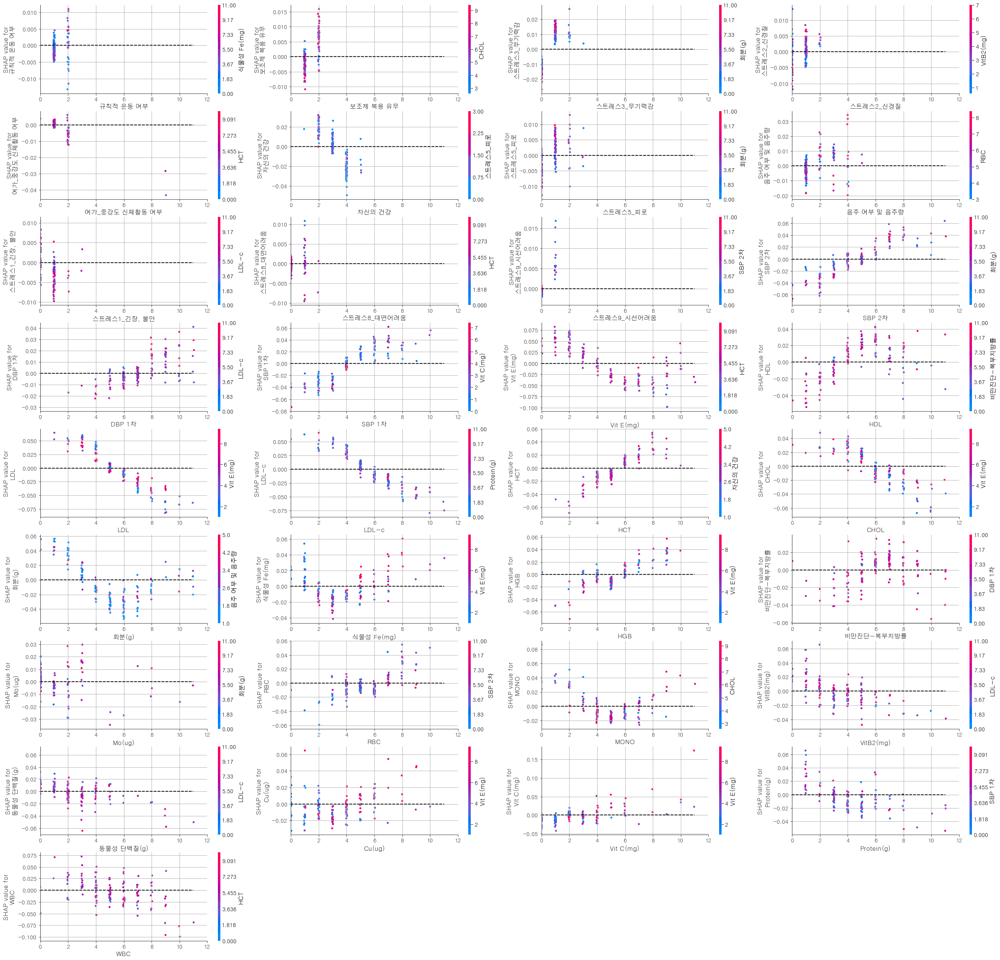

In [ ]:
import statsmodels.api as sm

# 각 변수 별 shap value 변화를 Lowess Regression을 통하여 value가 0이 되는 구간을 찾음.
ax = plt.figure(figsize=(35,35))
for i in range(33):    
    shap.plots.scatter(shap_values2[:,i],ax=ax.add_subplot(9,4,i+1,),show=False,hist=False,color=shap_values2)#,xmin=0,xmax=12
    plt.plot(np.arange(0,12),np.arange(0,12)*0,color='k',linestyle='--')
#   regres = sm.nonparametric.lowess(shap_values2.data[:,i],shap_values2.values[:,i],frac=.6) # lowess
#   plt.plot(regres[:,1],regres[:,0], color="orange", )
#   idx = np.argwhere(np.diff(np.sign(0-regres[:,0]))).flatten() #교차점 점찍기
#   plt.plot(regres[idx,1],regres[idx,0],'ro')
    plt.grid(which='major')
plt.show()

Permutation explainer: 134it [00:39,  2.56it/s]
y = [0.0015885]x + -0.0025889850889851073
[1.62982589]
y = [0.00815908]x + -0.010791144831624576
[1.32259382]
y = [0.0170045]x + -0.010642445524941452
[0.62586056]
y = [0.00151862]x + -0.0013206933837015115
[0.86966416]
y = [-0.00323235]x + 0.0038984210921091996
[1.20606236]
y = [-0.01650111]x + 0.05017507664369128
[3.04070958]
y = [0.00412335]x + -0.003654029080038049
[0.8861803]
y = [0.0037304]x + -0.006292438781534473
[1.68680097]
y = [-0.00283266]x + 0.001503191688641047
[0.53066374]
y = [0.00127444]x + -0.0003526043848624497
[0.27667443]
y = [0.00835965]x + -0.0008488243782361405
[0.10153831]
y = [0.01046444]x + -0.051037926006644745
[4.87727104]
y = [0.00517475]x + -0.035226579399855726
[6.80739823]
y = [0.01199686]x + -0.05235059849597291
[4.36369309]
y = [-0.01025798]x + 0.04789785243559604
[4.6693269]
y = [0.00398767]x + -0.016028279466267815
[4.01945508]
y = [-0.01558256]x + 0.08459676289922709
[5.42893914]
y = [-0.01339665]x + 

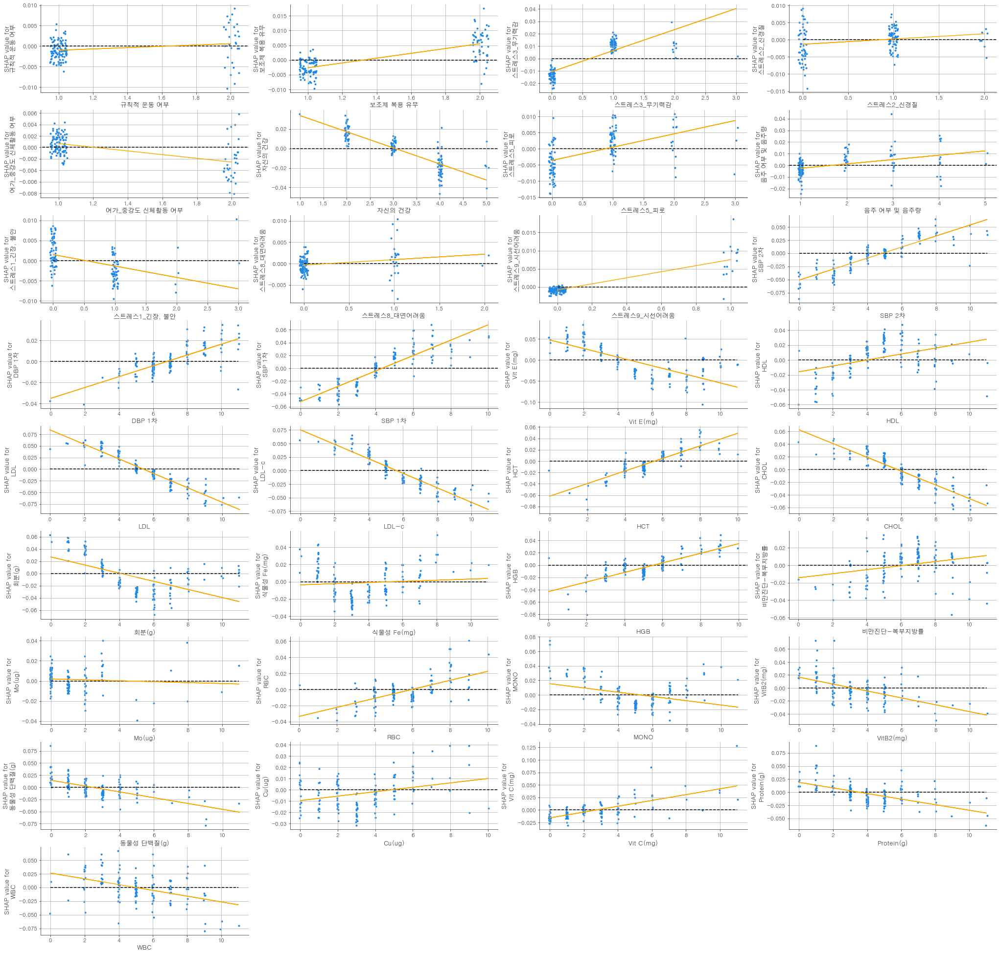

[3.0, 3.0, 2.0, 2.0, 3.0, 5.0, 2.0, 3.0, 2.0, 2.0, 2.0, 6.0, 8.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 6.0, 7.0, 7.0, 8.0, 6.0, 7.0, 7.0, 5.0, 4.0, 6.0, 4.0, 5.0, 6.0]


In [ ]:
# NonScale 출력
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import (LinearRegression, Ridge, Lasso, 
                                  ElasticNet ,LogisticRegression,SGDRegressor,
                                  PassiveAggressiveRegressor,Lars,PassiveAggressiveRegressor,
                                  PoissonRegressor)
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor,AdaBoostRegressor
from sklearn.dummy import DummyRegressor
from sklearn.gaussian_process import GaussianProcessRegressor

bind_data = cont_data.apply(lambda x: pd.cut(x,bins=np.histogram(x, bins=12,)[1],labels=False),axis=0).fillna(0).copy()

# bind_data에 어느 columns를 추가하여 결과를 볼 지 선택
X = pd.concat([cate_data,bind_data],axis=1).copy()
#X = pd.concat([bind_data,data.loc[:,cate_columns].copy()],axis=1).drop(columns=['현질환','고혈압 의사진단','고지혈증 의사진단','현재 복용 치료제 유무']).copy()
#X = cont_data.copy()
y = data.loc[:, '현질환'].values

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.222, random_state=17) 
scaler = MinMaxScaler()# Normalizer(), MaxAbsScaler(),StandardScaler(), MinMaxScaler()
x_ = scaler.fit_transform(X)
#x_train = scaler.fit_transform(x_train)
#x_test = scaler.fit_transform(x_test)

estimator_KNN = KNeighborsClassifier(11)
parameters_KNN = {
            'n_neighbors': range(1,20),
            'p': (1,2),
            'weights': ('uniform', 'distance'),
            'metric': ('minkowski', 'chebyshev','euclidean','manhattan'),
            'algorithm':('auto','kd_tree','ball_tree','brute')      
            }
        
# GridSearchCV 파라미터 탐색
kfold = KFold(n_splits=5, shuffle=True, random_state=7)

grid_search_KNN = GridSearchCV(
            estimator=estimator_KNN,
            param_grid=parameters_KNN,
            scoring = 'f1',  #'f1','roc_auc','accuracy'
            cv=kfold
          )

grid_search_KNN.fit(x_train,y_train)
y_pred=grid_search_KNN.predict(x_test)


clustering = shap.utils.hclust(x_train, y_train)
masker = shap.maskers.Partition(x_train, clustering=clustering)

explainer = shap.explainers.Permutation(grid_search_KNN.predict_proba,masker)
shap_values2 = explainer(x_train)
shap_values2 = shap_values2[...,1]


# 각 변수 별 shap value 변화를 Linear Regression을 통하여 value가 0이 되는 구간을 찾음.
linearR = LinearRegression()
temp=[]
ax = plt.figure(figsize=(35,35))
for i in range(33):
    shap.plots.scatter(shap_values2[:,i],ax=ax.add_subplot(9,4,i+1,),show=False,hist=False)
    plt.plot(np.arange(0,12),np.arange(0,12)*0,color='k',linestyle='--')
    X=shap_values2[:,i].data.reshape(-1,1)
    y=shap_values2[:,i].values
    lr = linearR.fit(X,y)
    lr_pred = lr.predict(X) # regression
    print('y = {}x + {}'.format(linearR.coef_,linearR.intercept_))
    print(-linearR.intercept_/linearR.coef_)
    temp.append(np.ceil((-linearR.intercept_/linearR.coef_)[0])+1)
    plt.plot(X,lr_pred, color="orange")
   #idx = np.argwhere(np.diff(np.sign(0-lr_pred))).flatten() #교차점 점찍기
   #plt.plot(X[int(idx)],lr_pred[int(idx)],'ro')
    plt.grid(which='major')
plt.show()
print(temp)

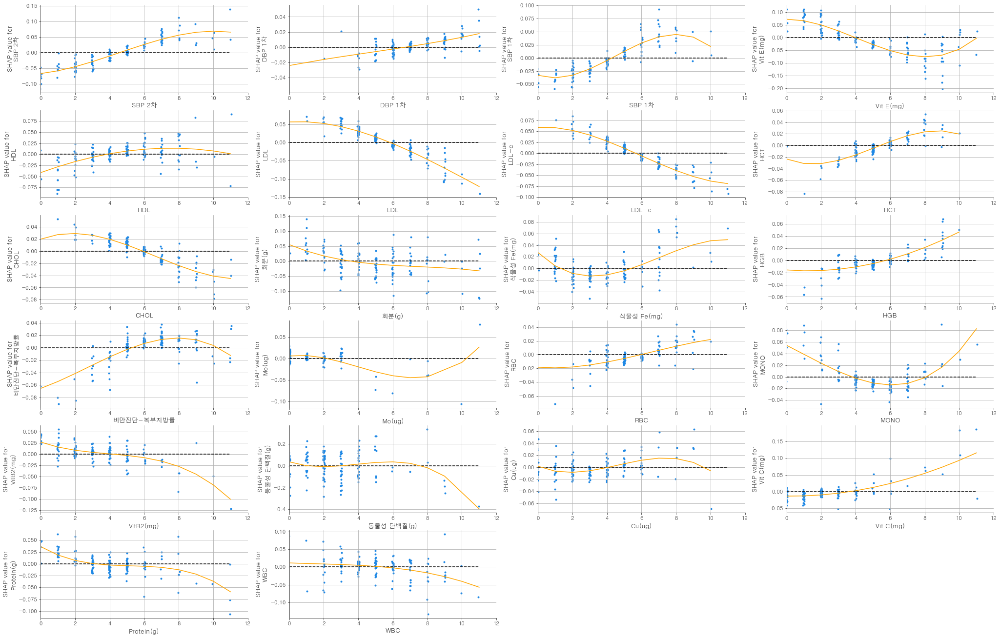

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import (LinearRegression, Ridge, Lasso, 
                                  ElasticNet ,LogisticRegression,SGDRegressor,
                                  PassiveAggressiveRegressor,Lars,PassiveAggressiveRegressor,
                                  PoissonRegressor)
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor,AdaBoostRegressor
from sklearn.dummy import DummyRegressor
from sklearn.gaussian_process import GaussianProcessRegressor

# 각 변수 별 shap value 변화를 Polynomial Regression을 통하여 value가 0이 되는 구간을 찾음.
linearR = Ridge(fit_intercept=False)
ax = plt.figure(figsize=(35,35))
for i in range(22):
    shap.plots.scatter(shap_values2[:,i],ax=ax.add_subplot(9,4,i+1,),show=False,hist=False,xmin=0,xmax=12)
    plt.plot(np.arange(0,12),np.arange(0,12)*0,color='k',linestyle='--')
    X=shap_values2[:,i].data.reshape(-1,1)
    y=shap_values2[:,i].values
    [X, y] = zip(*sorted(zip(X, y), key=lambda y: y[0]))
    poly_model = make_pipeline(PolynomialFeatures(degree=3), linearR)
    lr = poly_model.fit(X,y)
    lr_pred = lr.predict(X) # regression
    plt.plot(X,lr_pred, color="orange")
   #idx = np.argwhere(np.diff(np.sign(0-lr_pred))).flatten() #교차점 점찍기
   #plt.plot(X[int(idx)],lr_pred[int(idx)],'ro')
    plt.grid(which='major')
plt.show()

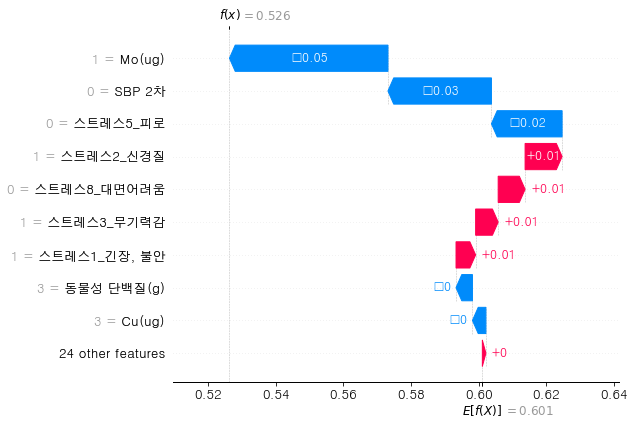

In [ ]:
# 개인의 데이터가 들어갔을 때, 모델에서는 어떻게 판단을 하는 지, 시각화
shap.plots.waterfall(shap_values2[11])

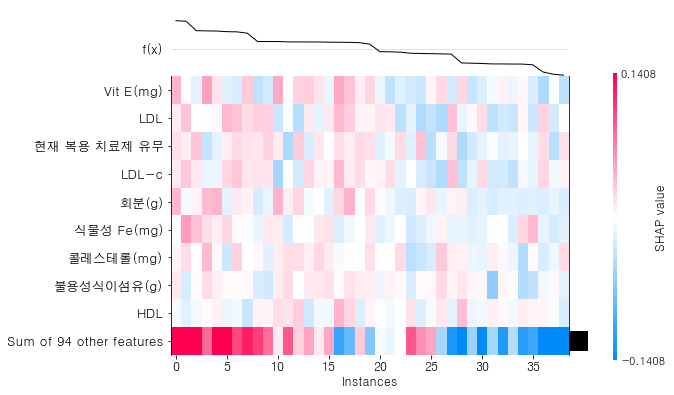

In [ ]:
# shap value 히트맵
shap.plots.heatmap(shap_values2,instance_order=shap_values2.sum(1))

In [ ]:
x_test_ = pd.DataFrame(x_test,columns=X.columns)
explainer = shap.KernelExplainer(grid_search_KNN.predict_proba, x_test_,output_names=X.columns.to_list())

shap_values = explainer.shap_values(x_test_)

  0%|          | 0/39 [00:00<?, ?it/s]

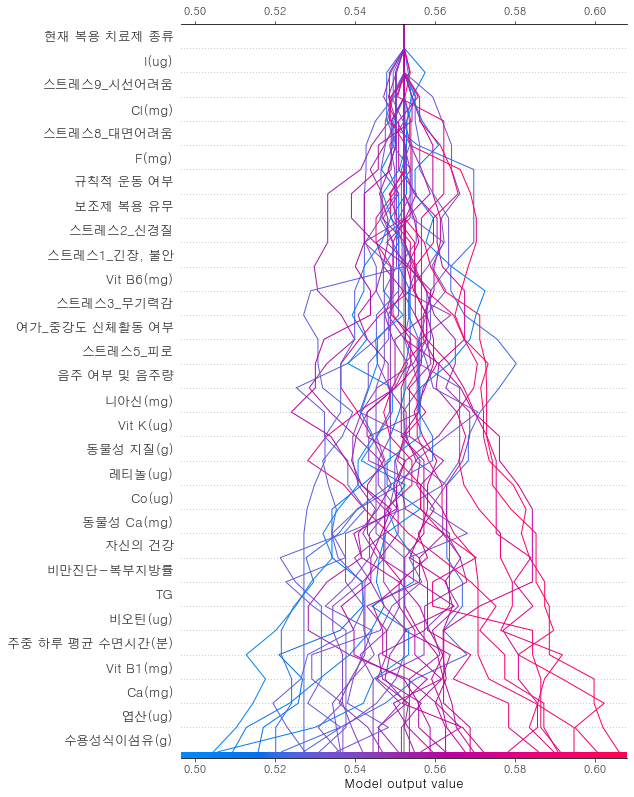

In [ ]:
# shap Decision plot
shap.plots.decision(explainer.expected_value[1],shap_values[1],
                    feature_names=x_test_.columns.to_list(), link='identity',feature_display_range=range(0,30),)